## Hex Parachute Example

In [7]:
%load_ext autoreload
%autoreload 2
%load_ext line_profiler

In [1]:
import os
os.environ["MKL_THREADING_LAYER"] = "GNU" # for pardiso: if the kernel crashes, try changing "GNU" to "INTEL"

In [2]:
import numpy as np

import dismech

geom = dismech.GeomParams(rod_r0=1e-3,
                          shell_h=1e-3)

material = dismech.Material(density=1500,
                            youngs_rod=10e6,
                            youngs_shell=10e8,
                            poisson_rod=0.5,
                            poisson_shell=0.3)

dynamic_3d_sim = dismech.SimParams(static_sim=False,
                                   two_d_sim=False,
                                   use_mid_edge=False,
                                   use_line_search=False,
                                   show_floor=False,
                                   log_data=True,
                                   log_step=1,
                                   dt=1e-2,
                                   max_iter=25,
                                   total_time=3.0,
                                   plot_step=10,
                                   tol=1e-4,
                                   ftol=1e-4,
                                   dtol=1e-2,
                                   sparse=True,
                                   solver='pardiso')

env = dismech.Environment()
env.add_force('gravity', g=np.array([0.0, 0.0, -9.81]))
env.add_force('aerodynamics', rho=1, cd=10)

geo = dismech.Geometry.from_txt(
    '../tests/resources/parachute/hexparachute_n6_python.txt')

robot = dismech.SoftRobot(geom, material, geo, dynamic_3d_sim, env)

In [3]:
# Manually set rod_shell and rod_rod_joints to EI = 0 GJ = 0
indices = np.concat((np.arange(0,15), np.arange(75,81), np.arange(88,100), np.arange(116,128), np.arange(135,141)))
for i in indices:
    robot.bend_twist_springs[i].stiff_EI = np.array([0,0])
    robot.bend_twist_springs[i].stiff_GJ = 0

robot.scale_mass_matrix(0, 100)  # weigh down parachute

stepper = dismech.NewmarkBetaTimeStepper(robot)
robots = stepper.simulate()

qs = np.stack([robot.state.q for robot in robots])

  0%|          | 0/300 [00:00<?, ?it/s]

In [4]:
t = np.arange(robot.sim_params.total_time, step=robot.sim_params.dt)  # (100)
options = dismech.AnimationOptions(title='Hex Parachute (N=6)',
                                    camera_view=(20,0),
                                    follow_data=True)
fig = dismech.get_interactive_animation_plotly(robot, t[::3], qs[::3], options)
fig.show()

In [5]:
#%matplotlib notebook
#from IPython.display import HTML
#ani = dismech.get_animation(robot, t[::3], qs[::3], options)
#HTML(ani.to_jshtml())
#ani.save('hex_parachute.gif', 'pillow')

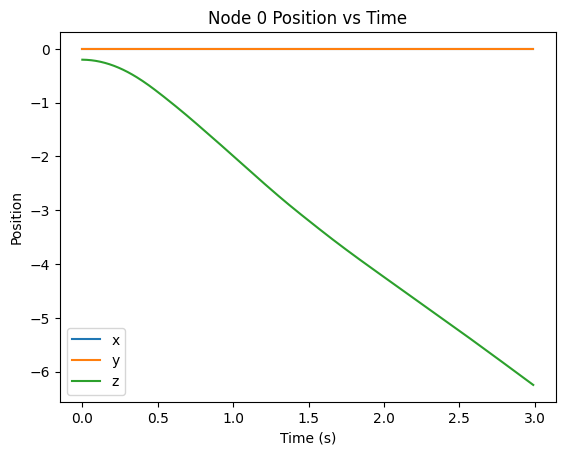

[-5.29223020e-07 -3.96447260e-07 -6.24732648e+00]


In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
log_node_index = 0

node_pos = qs[:,robot.map_node_to_dof(log_node_index)]
plt.plot(t, node_pos, label=['x','y','z'])
plt.title("Node {} Position vs Time".format(log_node_index))
plt.xlabel("Time (s)")
plt.ylabel("Position")
plt.legend()
plt.show()
print(node_pos[-1])